In [51]:
# IMPORT
from IPython.display import Image, Math

import os
import numpy as np
import pandas as pd
from utils import *
import pyAgrum
import pyAgrum.skbn as skbn
import pyAgrum.lib.notebook as gnb
import pyAgrum.lib.image as gimg
import pyAgrum.lib.dynamicBN as gdyn
import pyAgrum.causal as pyc
import pyAgrum.causal.notebook as cslnb
from pyAgrum.lib.discretizer import Discretizer
import re
from sklearn.cluster import KMeans
from kneed import KneeLocator
from scipy.stats import iqr, gaussian_kde, entropy
import matplotlib.pyplot as plt
plt.rcParams['figure.facecolor'] = 'white'  # Set background to white globally
plt.rcParams['axes.facecolor'] = 'white'    # Set axis background to white

In [52]:
def format_evidence_for_latex(evidence):
    formatted_evidence = []
    
    for var in evidence.keys():
        # Replace the part after the underscore with curly braces, if applicable
        var = re.sub(r'_(\w+)', r'_{\1}', var)  # Add {} around the part after the underscore
        
        # Replace '0' with '_{t-1}'
        var = var.replace('t', '_t')
        var = var.replace('0', '_{t-1}')

        # Append formatted variable to the list
        formatted_evidence.append(f"${var}$")  # Adding $ for LaTeX format
        
    return ', '.join(formatted_evidence)

def plot_distributions(var, distributions, var_midpoints, xlabel, ylabel):
    # Number of distributions to plot
    n = len(distributions)
    
    # Create subplots (one for each distribution)
    fig, axes = plt.subplots(1, n, figsize=(12, 4))

    # If there's only one plot, axes is not a list, so we handle it separately
    if n == 1:
        axes = [axes]
    var_midpoints = [round(float(m),2) for m in var_midpoints]
    for i, (data, title) in enumerate(distributions):
        # Plot the distribution in the corresponding subplot
        axes[i].bar(range(len(data)), data)
        axes[i].set_xticks(range(len(data)), var_midpoints)
        var_str = format_evidence_for_latex({var: None})
        axes[i].set_xlabel(xlabel)
        axes[i].set_ylabel(ylabel)
        axes[i].set_title(title)

    plt.tight_layout()
    plt.show()
    
def find_bin(value, edges):
    """
    Given a continuous value and an array of bin edges,
    return the index of the bin that contains the value.
    """
    idx = np.digitize(value, edges, right=False) - 1
    return int(max(0, min(idx, len(edges) - 2)))


def get_info(D, auditDict, var):
    if auditDict[var]['method'] == 'NoDiscretization':
        edges = auditDict[var]['values']
        midpoints = auditDict[var]['values']
        return 'NoDiscretization', edges, midpoints
    elif 'param' in auditDict[var] and isinstance(auditDict[var]['param'], list):
        edges = auditDict[var]['param']
        midpoints = [(edges[i] + edges[i+1]) / 2.0 for i in range(len(edges)-1)]
        return auditDict[var]['param'], edges, midpoints
    quantiles = np.linspace(0, 100, auditDict[var]['param'] + 1 if 'param' in auditDict[var] else auditDict[var]['nbBins'] + 1)
    edges = np.percentile(D[var].values, quantiles)
    midpoints = [(edges[i] + edges[i+1]) / 2.0 for i in range(len(edges)-1)]
    return quantiles, edges, midpoints


def optimal_bins_elbow_method(time_series, min_bins=2, max_bins=15, plot=True):
    """
    Determines the optimal number of bins using the elbow method with KMeans clustering.

    Parameters:
    - time_series: numpy array or list of numerical values (1D time series)
    - min_bins: minimum number of bins to consider
    - max_bins: maximum number of bins to consider
    - plot: whether to plot the elbow curve

    Returns:
    - optimal_bins: The optimal number of bins for discretization
    """
    time_series = np.array(time_series).reshape(-1, 1)  # Ensure data is 2D for KMeans

    inertia_values = []
    bin_range = range(min_bins, max_bins + 1)

    for k in bin_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(time_series)
        inertia_values.append(kmeans.inertia_)

    # Use KneeLocator to find the elbow point
    kneedle = KneeLocator(bin_range, inertia_values, curve="convex", direction="decreasing")
    optimal_bins = kneedle.elbow

    if plot:
        plt.figure(figsize=(8, 5))
        plt.plot(bin_range, inertia_values, marker="o", linestyle="-", label="Inertia")
        plt.axvline(optimal_bins, linestyle="--", color="red", label=f"Optimal Bins: {optimal_bins}")
        plt.xlabel("Number of Bins (Clusters)")
        plt.ylabel("Inertia (WCSS)")
        plt.title("Elbow Method for Optimal Bin Selection")
        plt.legend()
        plt.grid(True)
        plt.show()

    return optimal_bins

In [53]:
import copy
from causalflow.preprocessing.data import Data


def load_D(indir, bagname):
    dfs = []
    for i, wp in enumerate(WP):
        if wp == WP.PARKING or wp == WP.CHARGING_STATION: continue
        for tod in TOD:
            files = [f for f in os.listdir(os.path.join(indir, "HH/my_nonoise", f"{bagname}", f"{tod.value}"))]
            files_split = [f.split('_') for f in files]
            wp_files = [f for f in files_split if len(f) == 3 and f[2].split('.')[0] == wp.value][0]
            wp_file = '_'.join(wp_files)
            # print(f"Loading : {wp_file}")
            filename = os.path.join(indir, "HH/my_nonoise", f"{bagname}", f"{tod.value}", wp_file)

            df = pd.read_csv(filename)
            df = df.drop(['pf_elapsed_time', 'T', 'R_X', 'R_Y', 'G_X', 'G_Y', 'NP', 'R_B'], axis=1)
            pd_mean = np.mean(df['PD'].values)
            df['PD'] = np.full_like(df['PD'].values, pd_mean)
            dfs.append(df)
        # if i == 4: break
    D = pd.concat(dfs, ignore_index=True)
    D = D[(D['R_V'] <= 0.6)]
    D.drop_duplicates(inplace=True)  # Remove exact duplicate rows
    D["PD"] = D["PD"].round(6)  # Reduce floating point precision issues
    # D = D[(D['PD'] <= 1.5)]
    # D['PD'] = np.round(D['PD'], 3)
    
    D.rename(columns={'R_V': 'RV', 'C_S': 'CS'}, inplace=True)
    d = copy.copy(D)
    original_names = list(D.columns)
    D.columns = [f'{v}t' for v in original_names]

    # Add lagged variable
    for v in original_names:
        D[f'{v}0'] = np.concatenate([D[f'{v}t'].values[1:], [0]])
    D = D.iloc[1:].reset_index(drop=True)  # Remove first row
    D = D.iloc[:-1].reset_index(drop=True)  # Remove last row
    
    return d, D


def load_specific_D(indir, bagname, wp, tod):

    files = [f for f in os.listdir(os.path.join(indir, "HH/my_nonoise", f"{bagname}", f"{tod}"))]
    files_split = [f.split('_') for f in files]
    wp_files = [f for f in files_split if len(f) == 3 and f[2].split('.')[0] == wp][0]
    wp_file = '_'.join(wp_files)
    # print(f"Loading : {wp_file}")
    filename = os.path.join(indir, "HH/my_nonoise", f"{bagname}", f"{tod}", wp_file)

    df = pd.read_csv(filename)
 
    D = df.drop(['pf_elapsed_time', 'T', 'R_X', 'R_Y', 'G_X', 'G_Y', 'NP', 'R_B'], axis=1)
    D = D[(D['R_V'] <= 0.6)]
    # D = D[(D['PD'] <= 1.5)]
    # D['PD'] = np.round(D['PD'], 3)
    D.drop_duplicates(inplace=True)  # Remove exact duplicate rows
    D["PD"] = D["PD"].round(6)  # Reduce floating point precision issues
    
    D.rename(columns={'R_V': 'RV', 'C_S': 'CS'}, inplace=True)
    d = copy.copy(D)

    original_names = list(D.columns)
    D.columns = [f'{v}t' for v in original_names]

    # Add lagged variable
    for v in original_names:
        D[f'{v}0'] = np.concatenate([D[f'{v}t'].values[1:], [0]])
    D = D.iloc[1:].reset_index(drop=True)  # Remove first row
    D = D.iloc[:-1].reset_index(drop=True)  # Remove last row
    
    return d, D

In [54]:
INDIR = '/home/lcastri/git/PeopleFlow/utilities_ws/src/RA-L/hrisim_postprocess/csv'
BAGNAME = 'noncausal-28022025'
df, D = load_D(INDIR, BAGNAME)

PD_unique = np.unique(df['PD'].values)
print(f"Unique PD values: {len(PD_unique)}")
plt.boxplot(df['PD'].values)
plt.show()

Unique PD values: 564


/tmp/ipykernel_2570150/3973204772.py:22: DeprecationWarning: 
  ** Discretizer.discretizedBN is deprecated since pyAgrum>1.15.0. Please use Discretizer.discretizeTemplate instead.
  
  template = discretizer.discretizedBN(D)  # Use one dataset to define structure
/tmp/ipykernel_2570150/3973204772.py:42: DeprecationWarning: 
  ** Discretizer.discretizedBN is deprecated since pyAgrum>1.15.0. Please use Discretizer.discretizeTemplate instead.
  
  discretized_D = discretizer.discretizedBN(D)  # Apply the same discretization



** audit **
- TODt : 
    + method : NoDiscretization
    + values : [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]
    + type : Discrete
- RVt : 
    + method : expert
    + param : [0, 0.088, 0.499, 0.509]
    + type : Continuous
    + minInData : 1.5518480722676031e-06
    + maxInData : 0.536939834171335
- CSt : 
    + method : NoDiscretization
    + values : [0. 1.]
    + type : Discrete
- OBSt : 
    + method : NoDiscretization
    + values : [0. 1.]
    + type : Discrete
- PDt : 
    + method : NoDiscretization
    + values : [0.0000000e+00 3.0700000e-04 3.6600000e-04 4.4400000e-04 4.4700000e-04
 4.5500000e-04 5.2900000e-04 5.3800000e-04 7.7300000e-04 7.8900000e-04
 7.9500000e-04 8.3500000e-04 9.1300000e-04 1.3280000e-03 1.5720000e-03
 1.5740000e-03 1.6170000e-03 1.6230000e-03 1.6620000e-03 1.7680000e-03
 1.7710000e-03 1.7760000e-03 1.8270000e-03 1.8630000e-03 2.0670000e-03
 2.1920000e-03 2.1950000e-03 2.2650000e-03 2.3280000e-03 2.3580000e-03
 2.3610000e-03 2.4930000e-03 2.59700

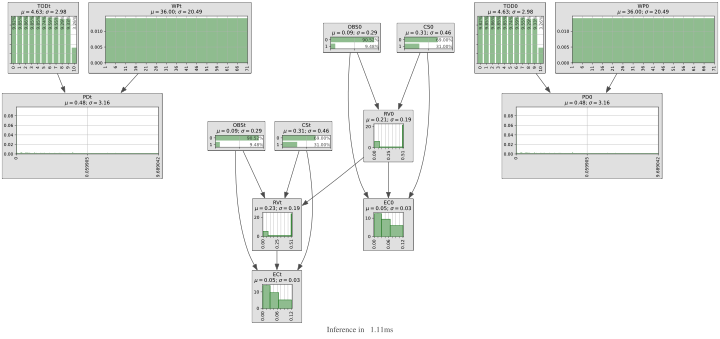

In [55]:
# DISCRETIZATION -- Compute binning once using one dataset (e.g., test_01)

discretizer = Discretizer(defaultDiscretizationMethod='quantile', discretizationThreshold=573)
# RV_bins = optimal_bins_elbow_method(D['R_Vt'].values, plot=False)
# EC_bins = optimal_bins_elbow_method(D['ECt'].values, plot=False)
# PD_bins = optimal_bins_elbow_method(D['PD0'].values, plot=False)
# Set the same binning for all datasets
# discretizer.setDiscretizationParameters('R_V0', 'quantile', RV_bins)
# discretizer.setDiscretizationParameters('R_Vt', 'quantile', RV_bins)
# discretizer.setDiscretizationParameters('EC0', 'quantile', EC_bins)
# discretizer.setDiscretizationParameters('ECt', 'quantile', EC_bins)
discretizer.setDiscretizationParameters('RV0', 'expert', [0, 0.088, 0.499, 0.509])
discretizer.setDiscretizationParameters('RVt', 'expert', [0, 0.088, 0.499, 0.509])
discretizer.setDiscretizationParameters('EC0', 'quantile', 3)
discretizer.setDiscretizationParameters('ECt', 'quantile', 3)
# discretizer.setDiscretizationParameters('PD0', 'NoDiscretization')
# discretizer.setDiscretizationParameters('PDt', 'NoDiscretization')
# discretizer.setDiscretizationParameters('PD0', 'quantile', len(PD_unique))
# discretizer.setDiscretizationParameters('PDt', 'quantile', len(PD_unique))

# Define structure
template = discretizer.discretizedBN(D)  # Use one dataset to define structure
template.addArc("WP0", "PD0")
template.addArc("TOD0", "PD0")
template.addArc("WPt", "PDt")
template.addArc("TODt", "PDt")
template.addArc("PD0", "PDt")

template.addArc("OBS0", "EC0")
template.addArc("OBS0", "RV0")
template.addArc("CS0", "EC0")
template.addArc("CS0", "RV0")
template.addArc("RV0", "EC0")
template.addArc("OBSt", "RVt")
template.addArc("OBSt", "ECt")
template.addArc("CSt", "RVt")
template.addArc("CSt", "ECt")
template.addArc("RVt", "ECt")
template.addArc("RV0", "RVt")

# Learn parameters for each dataset
discretized_D = discretizer.discretizedBN(D)  # Apply the same discretization
auditDict=discretizer.audit(D)
print()
print("** audit **")
for var in auditDict:
    print(f"- {var} : ")
    for k,v in auditDict[var].items():
        print(f"    + {k} : {v}")
learner = pyAgrum.BNLearner(D, template)
learner.useSmoothingPrior()
bn = learner.learnParameters(template)
gnb.showInference(bn, size=10)

pyAgrum.saveBN(bn, "CIE.bifxml")


In [56]:
bn = pyAgrum.loadBN("CIE.bifxml")

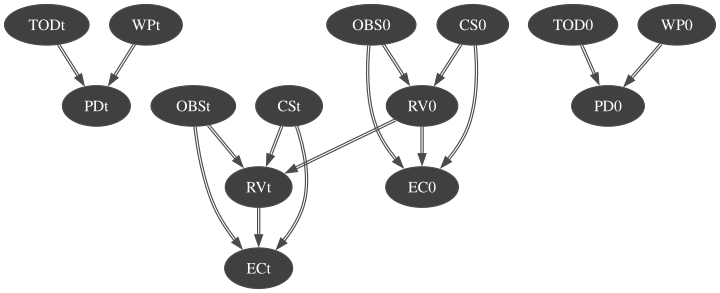

In [57]:
cm = pyc.CausalModel(bn)
cslnb.showCausalModel(cm, size="10!")

In [58]:
target_var = 'ECt'
target_var_str = format_evidence_for_latex({target_var: None})
intervention_var = "RVt"

static_duration = 5
dynamic_duration = 4
charging_time = 2
LOAD_FACTOR = 5
ROBOT_MAX_VEL = 0.5
K_nl_s = 100 / (static_duration * 3600)
K_nl_d = (100 / (dynamic_duration * 3600) - K_nl_s)/(ROBOT_MAX_VEL)
K_l_s = K_nl_s * LOAD_FACTOR
K_l_d = K_nl_d * LOAD_FACTOR

quantiles_R_V, edges_R_V, midpoints_R_V = get_info(D, auditDict, intervention_var)
quantiles_EC, edges_EC, midpoints_EC = get_info(D, auditDict, target_var)
STEP = 5
time = 5

plot_fontsize = 20


a = pyc.doCalculusWithObservation(cm, target_var, {intervention_var, "CSt"})
display(Math(a.toLatex()))

<IPython.core.display.Math object>

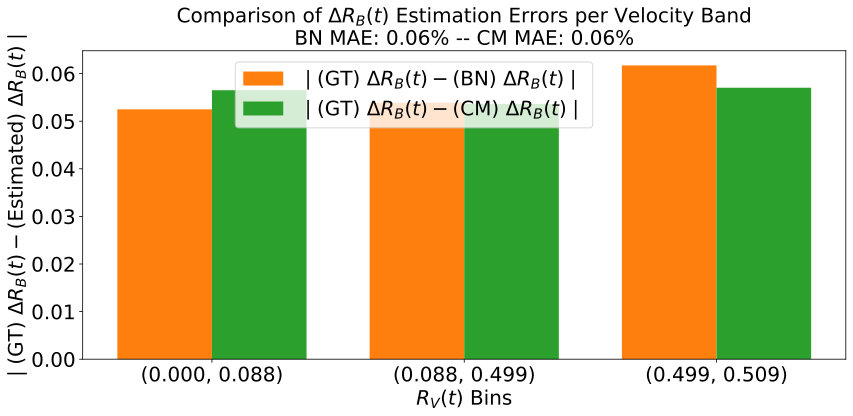

In [59]:
gt_noload = []
gt_load = []
gts = []
bayes_preds = []
causal_preds = []

RV_range = midpoints_R_V
for RV_val in RV_range:
    RV_bin_idx = find_bin(RV_val, edges_R_V)
    RV_val = midpoints_R_V[RV_bin_idx]
    GTLOAD = time * (K_l_s + K_l_d * RV_val) 
    GTNOLOAD = time * (K_nl_s + K_nl_d * RV_val)
        
    # --- BN prediction ---
    ie = pyAgrum.VariableElimination(bn)
    bn_prior = ie.posterior(target_var)
    evidence = {intervention_var: RV_bin_idx, "CSt": 0}
    evidence_str = format_evidence_for_latex(evidence)
    ie.setEvidence(evidence)
    ie.makeInference()
    bn_posterior = ie.posterior(target_var)
    bn_posterior_values = bn_posterior.toarray()
    pred_bn = sum(bn_posterior_values[j] * midpoints_EC[j] for j in range(len(bn_posterior_values)))
    bayes_pred = (time/STEP)*pred_bn
                
    # --- CausalModel prediction ---
    formula, adj, exp = pyc.causalImpact(cm, on=target_var, doing=intervention_var, knowing={"CSt"}, values=evidence)
    posterior_causal = adj.toarray()
    pred_causal = sum(posterior_causal[j] * midpoints_EC[j] for j in range(len(posterior_causal)))
    causal_pred = (time/STEP)*pred_causal
                
    gt_noload.append(GTNOLOAD)
    gt_load.append(GTLOAD)
    gts.append((GTNOLOAD+GTLOAD)/2)
    bayes_preds.append(bayes_pred)
    causal_preds.append(causal_pred)

# Define bar width and offsets
x_indexes = np.arange(len(RV_range))

cm_errors = np.abs(np.array(causal_preds) - np.array(gts))
bn_errors = np.abs(np.array(bayes_preds) - np.array(gts))

# Compute Mean Absolute Error (MAE)
cm_MAE = np.mean(cm_errors)
bn_MAE = np.mean(bn_errors)

# Plot bars for each category with offset
plt.figure(figsize=(12, 6))
bar_width = 0.375
plt.bar(x_indexes, bn_errors, width=bar_width, label=r"$\mid (\text{GT})~\Delta R_{B}(t) - (\text{BN})~\Delta R_{B}(t) \mid$", color='tab:orange', alpha=1)
plt.bar(x_indexes + bar_width, cm_errors, width=bar_width, label=r"$\mid (\text{GT})~\Delta R_{B}(t) - (\text{CM})~\Delta R_{B}(t) \mid$", color='tab:green', alpha=1)
    
# Labeling
plt.xlabel(r"$R_V(t)$ Bins", fontdict={'fontsize': plot_fontsize})
plt.ylabel(r"$\mid (\text{GT})~\Delta R_{B}(t) - (\text{Estimated})~\Delta R_{B}(t) \mid$", fontdict={'fontsize': plot_fontsize})
plt.xticks(x_indexes+bar_width/2, [f"({edges_R_V[i-1]:.3f}, {edges_R_V[i]:.3f})" for i in range(1, len(edges_R_V))], fontdict={'fontsize': plot_fontsize})  # Format x-axis labels
plt.yticks(fontsize=plot_fontsize)  # Format x-axis labels
plt.title(r"Comparison of $\Delta R_B(t)$ " + f"Estimation Errors per Velocity Band\nBN MAE: {bn_MAE:.2f}% -- CM MAE: {cm_MAE:.2f}%", fontdict={'fontsize': plot_fontsize})
plt.legend(fontsize=plot_fontsize, loc=(0.2, 0.75))
plt.tight_layout()

plt.show()

In [60]:
target_var = 'PD0'
target_var_str = format_evidence_for_latex({target_var: None})
intervention_var = "TOD0"

# midpoints_PD = sorted(D[target_var].values)
quantiles_PD, edges_PD, midpoints_PD = get_info(D, auditDict, target_var)
quantiles_WP, edges_WP, midpoints_WP = get_info(D, auditDict, 'WP0')
STEP = 5
time = 5

plot_fontsize = 20

a = pyc.doCalculusWithObservation(cm, target_var, {intervention_var, "WP0"})
display(Math(a.toLatex()))

<IPython.core.display.Math object>

In [61]:
bn_err = []
cm_err = []
for idx_wp in edges_WP:
    gts = []
    bayes_preds = []
    causal_preds = []
    wp = list(WPS.keys())[int(idx_wp)]
    # wp_bin = find_bin(idx_wp, edges_WP) 
    wp_bin = int(idx_wp)-1 
    for idx_tod, tod in enumerate(TOD):
        
        df, D_tod = load_specific_D(INDIR, BAGNAME, wp, tod.value)
        # d = Data(df, df.columns)
        # d.plot_timeseries()
        PD = np.mean(D_tod[target_var].values)
        gts.append(PD)
        # --- BN prediction ---
        ie = pyAgrum.VariableElimination(bn)
        bn_prior = ie.posterior(target_var)
        # evidence = {intervention_var: idx_tod, "WP0": 1}
        evidence = {intervention_var: idx_tod, "WP0": wp_bin}
        evidence_str = format_evidence_for_latex(evidence)
        ie.setEvidence(evidence)
        ie.makeInference()
        bn_posterior = ie.posterior(target_var)
        bn_posterior_values = bn_posterior.toarray()
        pred_bn = sum(bn_posterior_values[j] * midpoints_PD[j] for j in range(len(bn_posterior_values)))
        bayes_pred = (time/STEP)*pred_bn
                        
        # --- CausalModel prediction ---
        formula, adj, exp = pyc.causalImpact(cm, on=target_var, doing=intervention_var, knowing={"WP0"}, values=evidence)
        posterior_causal = adj.toarray()
        pred_causal = sum(posterior_causal[j] * midpoints_PD[j] for j in range(len(posterior_causal)))
        causal_pred = (time/STEP)*pred_causal
                        
        bayes_preds.append(bayes_pred)
        causal_preds.append(bayes_pred)
        
    bn_errors = np.abs(np.array(bayes_preds)-np.array(gts))
    cm_errors = np.abs(np.array(causal_preds)-np.array(gts))
    
    bn_err.append(bn_errors)
    cm_err.append(cm_errors)

    # Define bar width and offsets
    bar_width = 0.25
    x_indexes = np.arange(len(TOD))

    # Plot bars for each category with offset
    plt.figure(figsize=(12, 6))
    plt.bar(x_indexes - bar_width, gts, width=bar_width, label="Ground Truth", color='tab:blue', alpha=1)
    plt.bar(x_indexes, bayes_preds, width=bar_width, label=r"BN: E[$\Delta R_B$|$R_V$,$C_S$]", color='tab:orange', alpha=1)
    plt.bar(x_indexes + bar_width, causal_preds, width=bar_width, label=r"CM: E[$\Delta R_B$|do($R_V$),$C_S$]", color='tab:green', alpha=1)
    plt.xticks(x_indexes, [f"{tod.value}" for tod in TOD], fontsize=plot_fontsize)  # Format x-axis labels
    plt.savefig(f"my_pd/{wp}.png")
    plt.close()
    
    plt.figure(figsize=(12, 6))
    plt.bar(x_indexes - bar_width/2, bn_errors, width=bar_width, label=r"BN: E[$\Delta R_B$|$R_V$,$C_S$]", color='tab:orange', alpha=1)
    plt.bar(x_indexes + bar_width/2, cm_errors, width=bar_width, label=r"CM: E[$\Delta R_B$|do($R_V$),$C_S$]", color='tab:green', alpha=1)
    plt.xticks(x_indexes, [f"{tod.value}" for tod in TOD], fontsize=plot_fontsize)  # Format x-axis labels
    plt.title(r"Comparison of $PD(t)$ " + f"Estimation Errors BN MAE: {np.mean(bn_errors, axis=0):.2f} -- CM MAE: {np.mean(cm_errors, axis=0):.2f}", fontdict={'fontsize': plot_fontsize})
    plt.savefig(f"my_pd/{wp}_err.png")
    plt.close()
    # break
    
# plt.figure(figsize=(12, 6))
# plt.bar(x_indexes - bar_width, np.mean(bn_err, axis=0), width=bar_width, label=r"BN: E[$PD$|$TS$,$WP$]", color='tab:orange', alpha=1)
# plt.bar(x_indexes + bar_width, np.mean(cm_err, axis=0), width=bar_width, label=r"CM: E[$PD$|do($TS$),$WP$]", color='tab:green', alpha=1)
# plt.xticks(x_indexes, [f"{tod.value}" for tod in TOD], fontsize=plot_fontsize)  # Format x-axis labels
# plt.title(r"Comparison of $PD(t)$ " + f"Estimation Errors per TOD\nBN MAE: {np.mean(np.mean(bn_err, axis=0), axis=0):.2f} -- CM MAE: {np.mean(np.mean(cm_err, axis=0), axis=0):.2f}", fontdict={'fontsize': plot_fontsize})
# plt.show()